# Week 2: Visualization (Video part 20)

## Objective:
- Find insights from data using visualization


### Visualization tools to:
1. Explore individual features
   - Histograms
   - Plots
   - Statistics
2. Explore feature relations
   - Scatter plots
   - Correlation plots
   - Plot (index vs feature statistics)
   - etc
  

#### Overview
- There is no recipe on how you find interesting things in the data
- EDA is an art! and visualizations are our art tools

### Explore individual features
#### Histograms `plt.hist(x)`
- Might be misleading, so try to overwrite the default bin size when using it.
- It aggregates the data, so we can not see if there are a lot of repeated values, or if there are many unique values.
- Example 1: we might think the data which forms the histogram in the left below has a lot of zeros. But when we take the logarithm of the value and build histogram again (right histogram here in the picture), we can clearly see that the distribution has a lot more distinct values than zero.
- Conclusion: we can not make a conclusion from a single plot, if we have a hypothesis, try to make several plots to prove it.
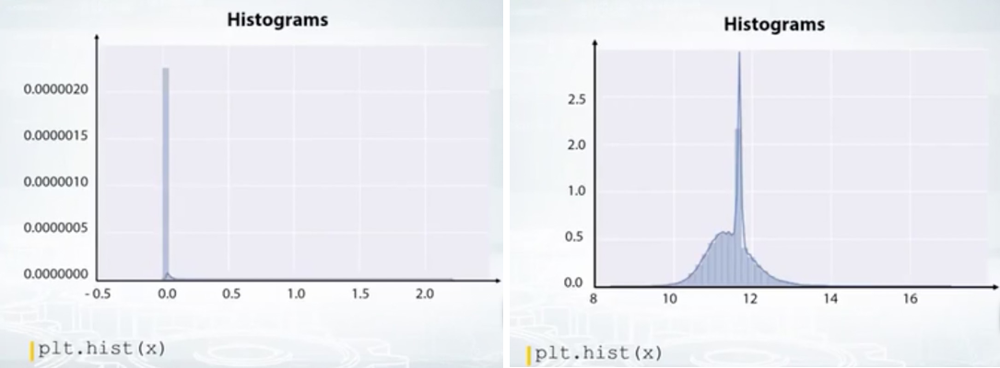
- The second interesting thing in the example above is the peak. It turns out that the peak is located exactly at the mean value of this feature - seems like the organizers filled the missing values with the mean values for us. So now we understand that the values are originally missing.
- How can we use this information?
  1. we can fill these values with nans again. This is good if we use model like XGBoost that could work with missing values, and so it might benefit from explicit missing values.
  2. or we can fill the missing values with other numbers eg -999.
  3. or we can generate a new feature which will indicate that the values are missing, this could be useful for linear models
 
#### Scatterplot `plt.plot(x. '.')`
- Plot row index on X axis, and feature value on Y axis
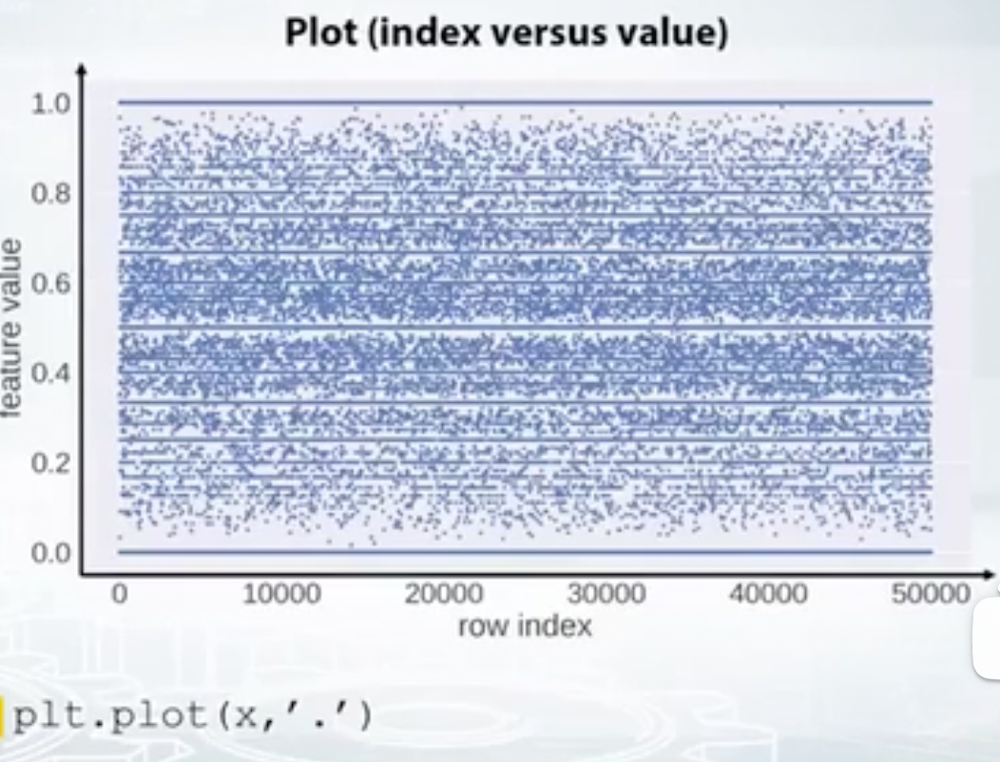
- Example 1:
  - We observe horizontal lines on this kind of plot, we understand there are a lot of repeated values in this feature
  - Note the randomness over the indices. That is, we see some horizontal patterns but no vertical ones. It means that the data is properly shuffled.
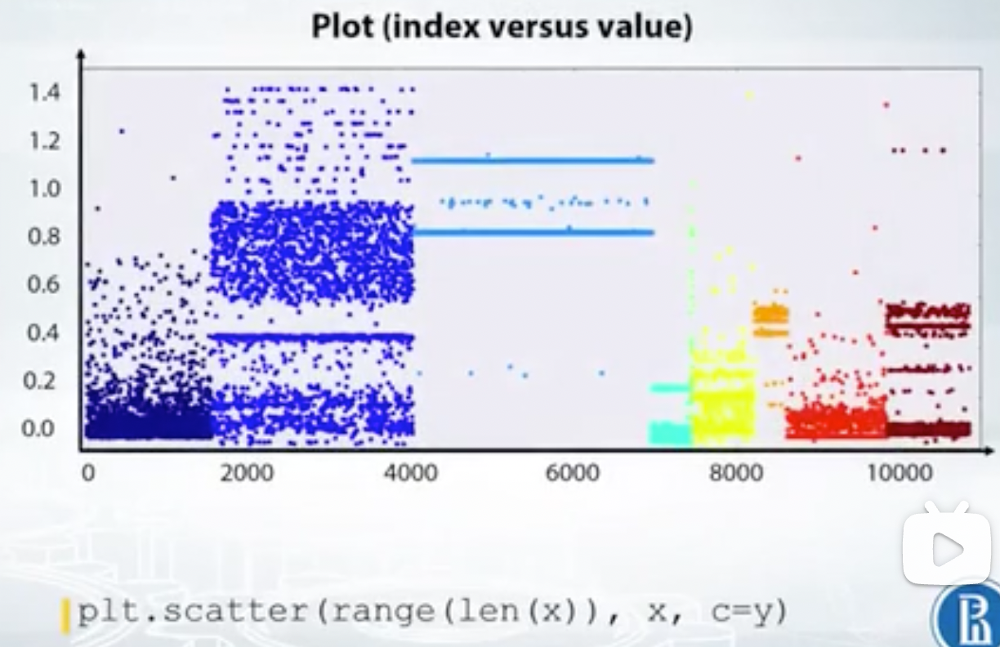
- Example 2: We can color code the points according to their labels.
  - Here, the feature is quite good as it give nice class separation.
  - The data is not shuffled here, it is in fact sorted by class label.
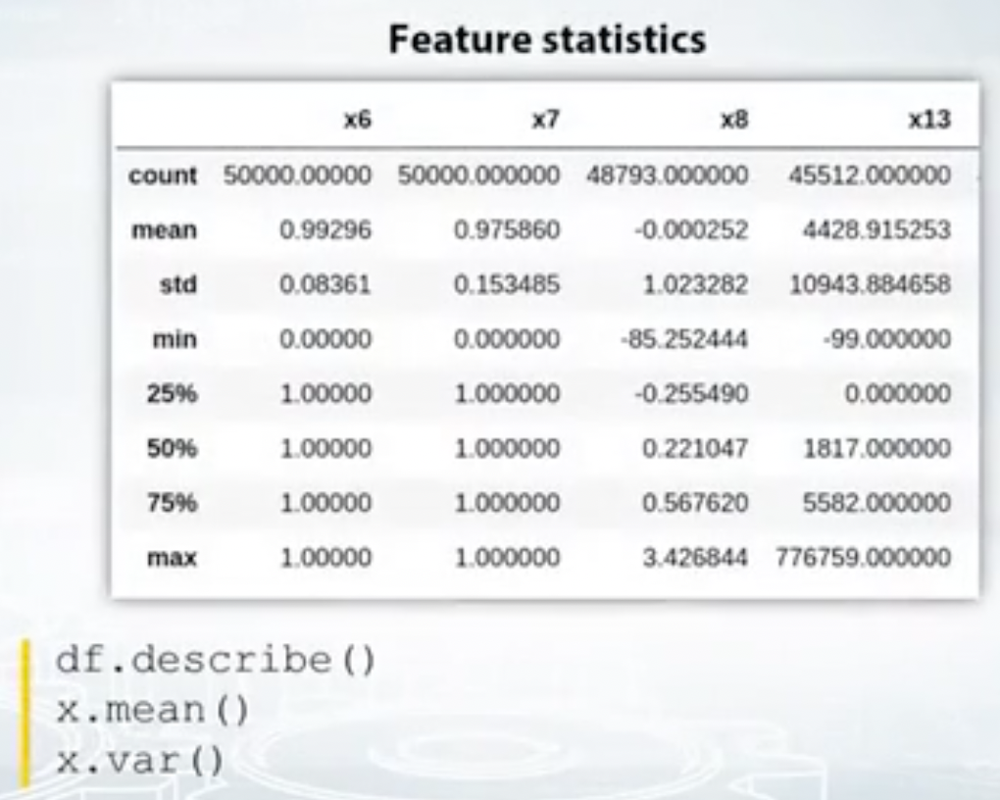
- Example 3: It is useful to examine statistics with pandas' describe function.
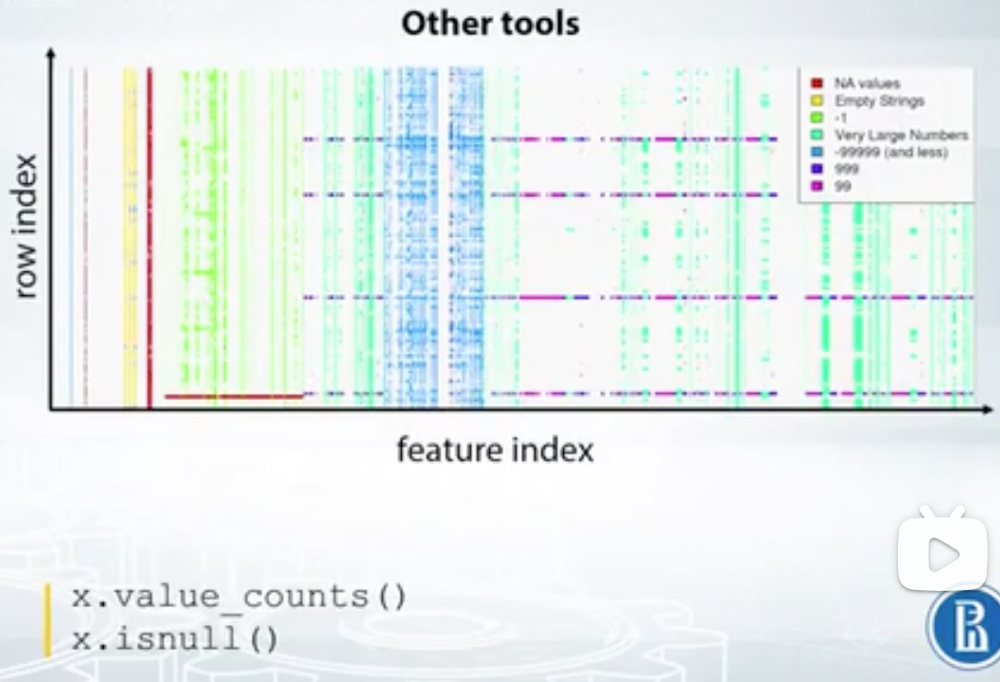
- Example 4: Use value_counts() to examine distinct feature values
  - We can visualize null patterns on the data as shown

### Explore feature relations

#### Scatterplot `plt.scatter(x1,x2)`
- Sometimes it is hard to make conclusions looking at one feature at a time
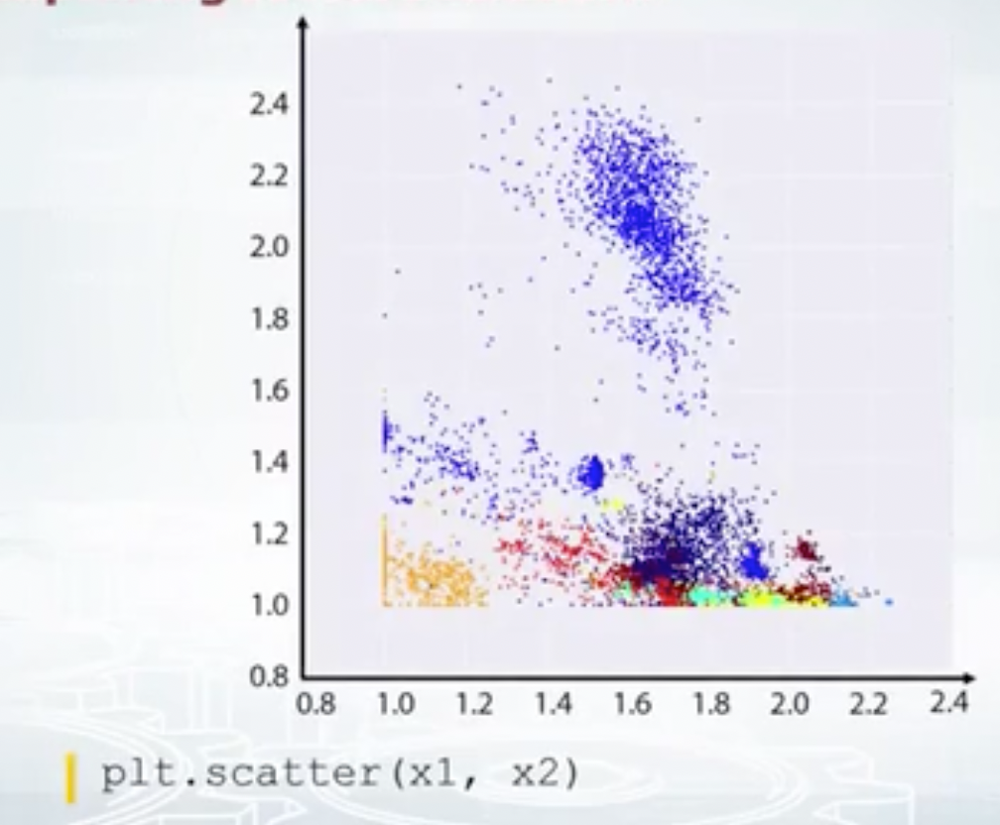
- Example 1: Plot a pair of features, with the feature value shown by the coordinate position. For classification task, we can color code the points with their labels, like in the picture. For regression, we can use point size, or heat map coloring to encode the label value.
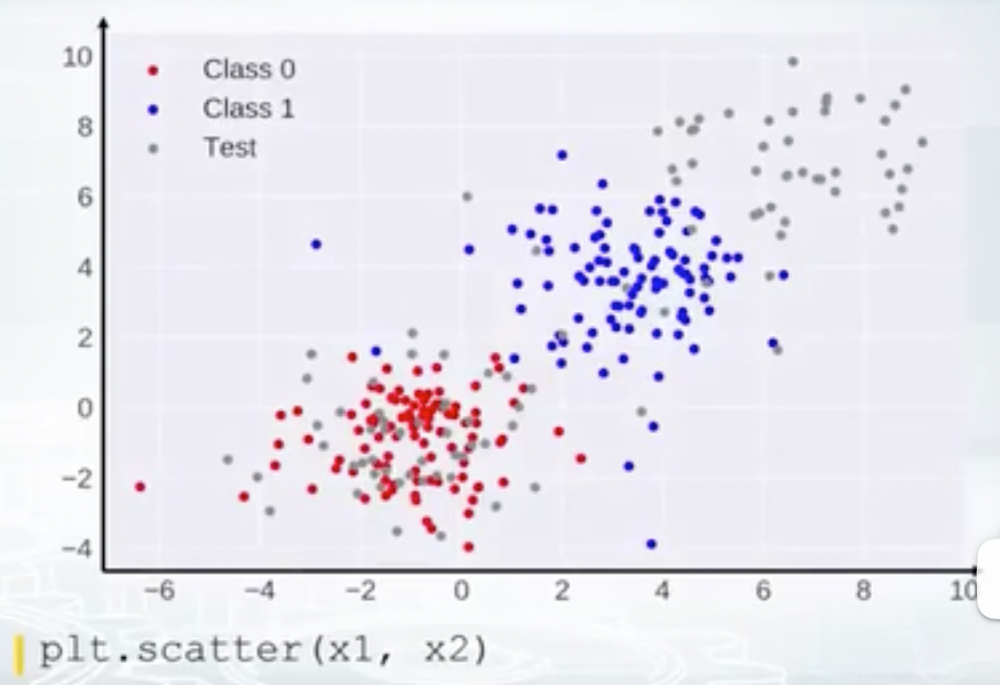
- Example 2: We can use scatter plot to check if the data distribution in the train and test set are the same.
  - Here, the red and blue points belong to class 0 and class 1 respectively. While gray points belong to test set. We don't have the labels for test set.
  - We see a lot of gray points are located in the region where we don't have any training data (at right top corner of the plot), and this is bad.
  - If we see some kind of discrepency between the distribution of colored and gray points, then we should stop and think if we're doing it right. It can be a bug in the code or it can be an overfitted feature
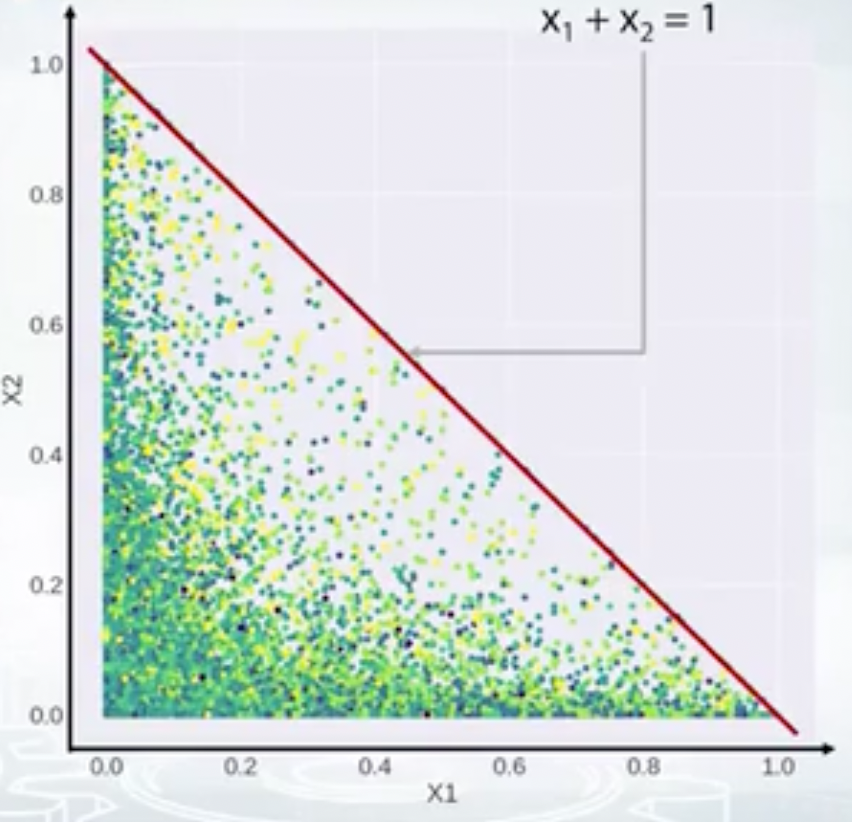
- Example 3: Suppose we plot 2 feature here, what can we say about their relation? Here, we see that X2 is less than or equal to 1-X1. (The equation for a diagonal line is X1 + X2 = 1).
  - Knowing this, we can generate new features like: (for trees) the difference or ratio between X1 and X2.
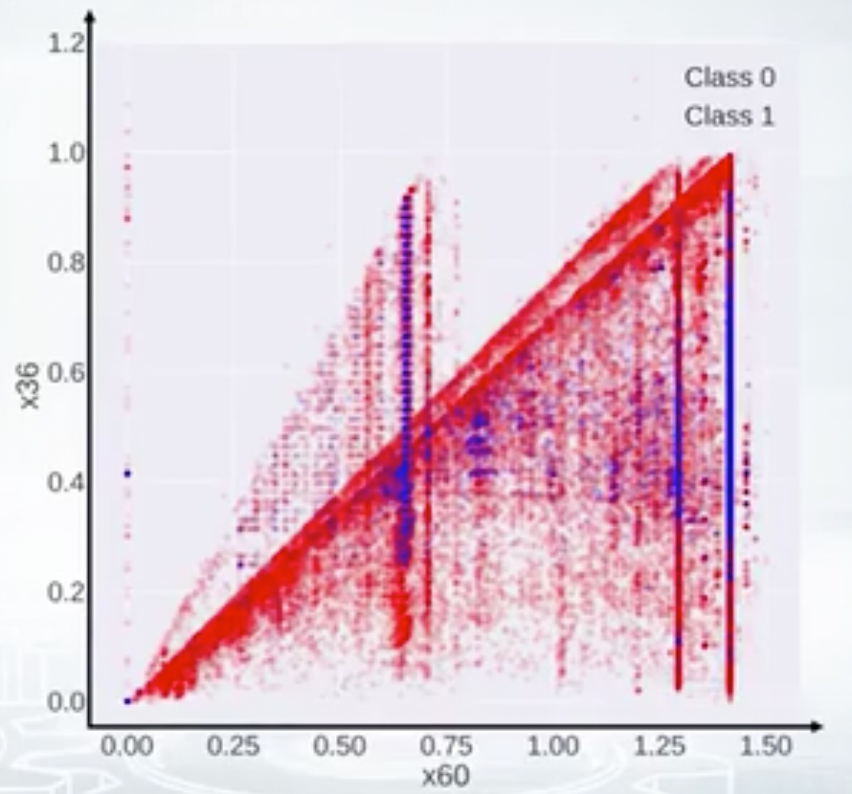
- Example 4: It's hard to say what is the true relation between the features here but our goal is not to decode the data but to generate new features and get a better score.
  - We see several triangles on the picture here, so we could probably make a feature specifying which "traingle" a given point belongs to.
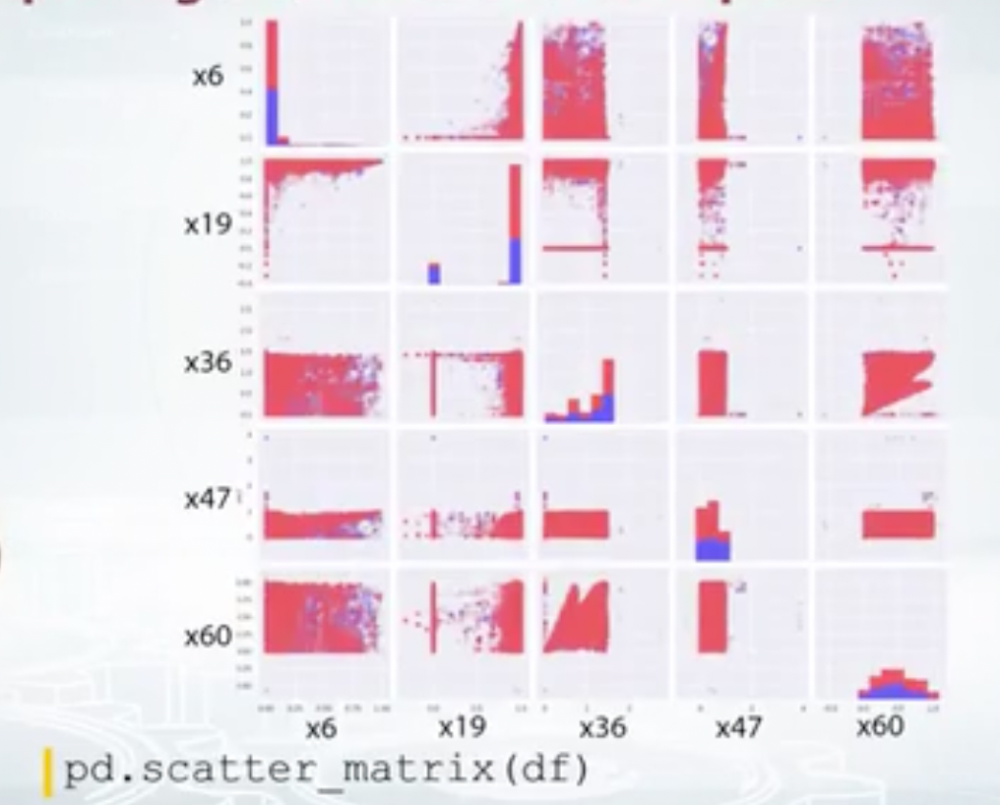
- Example 5: When we have small number of features, we can plot pairwise scatterplot at once uisng `pd.scatter_matrix(df)`
  - Good to have both scatterplot and histogram at the same time. Histogram give you information about densities, scatterplots show feature interactions.
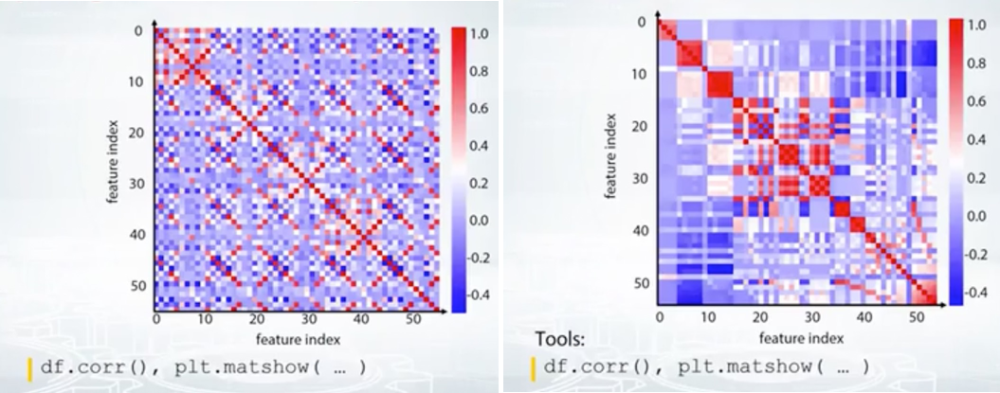
- Example 6: We can also compute distance between the column of our feature `df.corr(), plt.matshow()`
  - Commonly people visualize correlation metric.
  - Other visualization ideas:
    - How many rows such that the value of the first feature is larger than the value of the second feature?
    - How many distinct combination the features have in dataset?
  - If the matrix look like a total mess like the example here (left picture), we can run some kind of clustering like k-Means clustering on the rows and columns of this matrix and reorder the feature (right picture)
- Example 7: We can see som kind of faeture groups in the above (right picture) example
  - It is a good idea to generate new features based on the groups
  - Some aggregated statistics on grouped features might be good feature idea
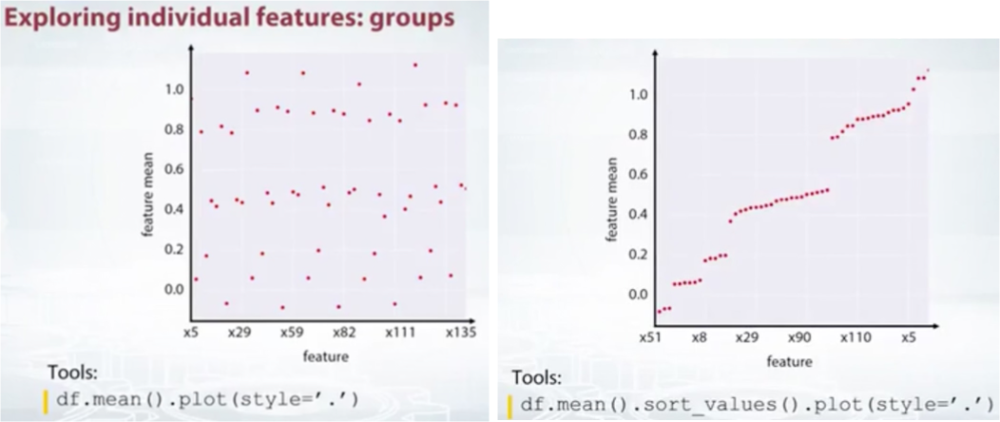
  - How to find feature groups?
    1. We calculate the statistics of each feature (eg mean values)
    2. Plot them against the column index (in the x axis)
    3. The plot can look quite random if the columns are shuffled (left picture)
    4. Try to sort the columns based on the statistic we calculated (right picture) - we can clearly there are groups of features here where they have similar mean
    5. Now we can use this information to generate new features

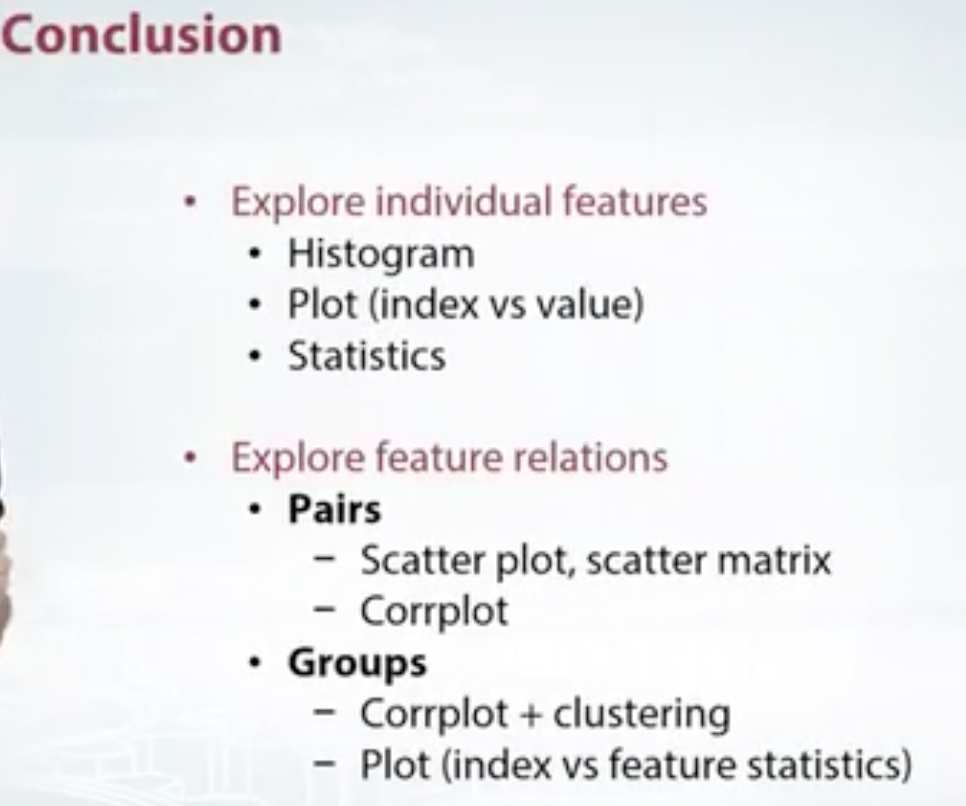

# What I learnt:
1. Use scatterplot to visualize repeating values in a feature (x=index, y=feature value)
   - Horizontal line across X axis from left to right indicate repeated value across these indices for a certain feature value
2. Plot value_counts to visualize missing values
3. Plot label against feature value to check if we have instances in test set with no traning data
4. Plot 2 features using scatterplot to check for their relationship, additionally, color encode the points using label
5. Plot pairwise scatter matrix to check on all feature relations
6. Plot correlation matrix on features
7. To improve correlation matrix, we can first group certain features together in groups (maybe using k-means etc) then rearrange them into these groups, and plot again
8. Plot features aggregated statistics to visualize any possible feature groups (x=feature columns, y=aggregated values eg mean,median etc). We can then use this information to create new features. 